# CS180 Project 2 — Work Notebook

> Keep figures saved to `outputs/...` via `save_image()`; copy best to `report/img/` for your write-up.

## 0. Setup
- Imports, paths, and helpers


In [1]:
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from src.io_utils import *
from src.filters import *
from src.sharpen import *
from src.hybrid import *
from src.stacks import *
from src.viz import *
from src.align_image_code import *
from src.line_detection import *
from src.img_edition import *
from scipy.ndimage import gaussian_filter
import time
from cv2 import getGaussianKernel
from scipy.signal import convolve2d
import skimage as sk
import skimage.io as skio
from skimage.morphology import dilation, disk


PROJ = Path('.')
INP  = PROJ/'data/inputs'
MSK  = PROJ/'data/masks'
OUTS = {
    'p1_1': PROJ/'outputs/part1_1',
    'p1_2': PROJ/'outputs/part1_2',
    'p1_3': PROJ/'outputs/part1_3',
    'p2_1': PROJ/'outputs/part2_1_sharpen',
    'p2_2': PROJ/'outputs/part2_2_hybrid',
    'p2_3': PROJ/'outputs/part2_3_stacks',
    'p2_4': PROJ/'outputs/part2_4_blend',
}
for p in OUTS.values(): ensure_dir(p)

def savefig(fig, rel_out):
    path = PROJ/rel_out
    ensure_dir(path.parent)
    fig.savefig(path, bbox_inches='tight', dpi=150)
    plt.close(fig)


In [27]:
def img_import(path: Path | str, color: bool = True) -> np.ndarray:
    if color:
        img = imread_color(path)
        plt.imshow(img)
        plt.axis('off')
        plt.show()
    else:
        img = imread_gray(path)
        plt.imshow(img, cmap='gray')
        plt.axis('off')
        plt.show()

    return img

def vis_derivative(img):
    mn, mx = img.min(), img.max()
    M = max(abs(mn), abs(mx))
    return np.clip((img / (2*M) + 0.5)*255, 0, 255).astype(np.uint8)
    
def img_show(img, cmap=None, axis_off=True, vis_d=False):
    if vis_d:
        img = vis_derivative(img)

    plt.imshow(img, cmap=cmap)
    if axis_off:
        plt.axis('off')
    plt.show

## 1. Part 1: Fun with Filters
### 1.1 Convolutions From Scratch!


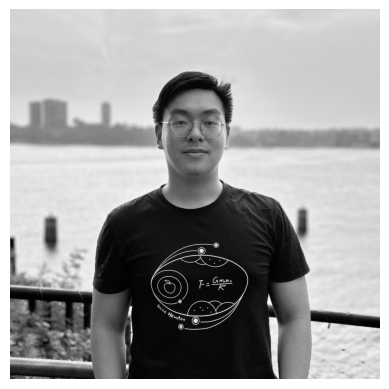

In [17]:
gray_img_path = INP/'jli.jpg'
gray_img = imread_gray(gray_img_path)
plt.imshow(gray_img, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
save_image(OUTS['p1_1']/'jli_original.jpg', gray_img)

In [3]:
box_filter = np.full((9, 9), 1/81, dtype=np.float32)

In [ ]:
start_time = time.perf_counter()
gray_img_filtered = convolve2d_loops(gray_img, box_filter)
end_time = time.perf_counter()

elapsed_time = end_time - start_time
print(f"Execution time: {elapsed_time:.4f} seconds")

Execution time: 9.8057 seconds


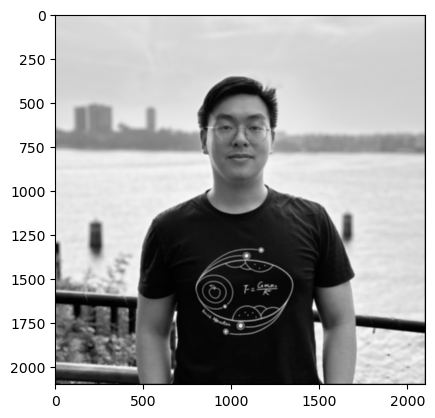

In [ ]:
plt.imshow(gray_img_filtered, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
start_time = time.perf_counter()
gray_img_filtered_builtin = convolve2d(gray_img, box_filter, 'same', 'fill')
end_time = time.perf_counter()

elapsed_time = end_time - start_time
print(f"Execution time: {elapsed_time:.4f} seconds")


Execution time: 0.4341 seconds


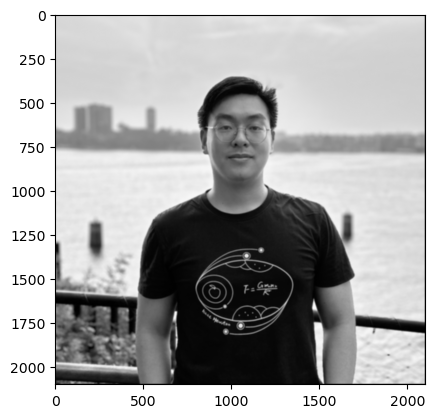

In [ ]:
plt.imshow(gray_img_filtered_builtin, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
save_image(OUTS['p1_1']/'jli_filtered.jpg', gray_img_filtered)

### 1.2: Finite Difference Operator

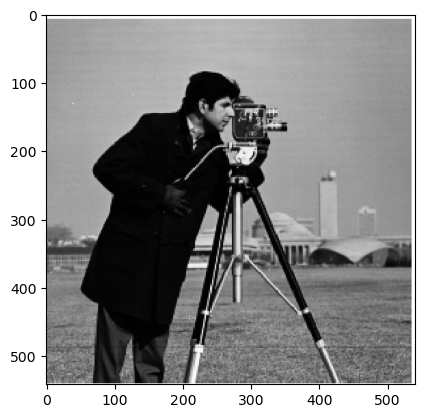

In [ ]:
cam_img_path = INP/'cameraman.png'
cam_img = imread_gray(cam_img_path)
plt.imshow(cam_img, cmap='gray')
plt.axis('off')
plt.show()

In [8]:
D_x = np.array([[1, 0, -1]])
D_y = np.array([[1], [0], [-1]])

In [157]:
def vis_derivative(img):
    mn, mx = img.min(), img.max()
    M = max(abs(mn), abs(mx))
    return np.clip((img / (2*M) + 0.5)*255, 0, 255).astype(np.uint8)


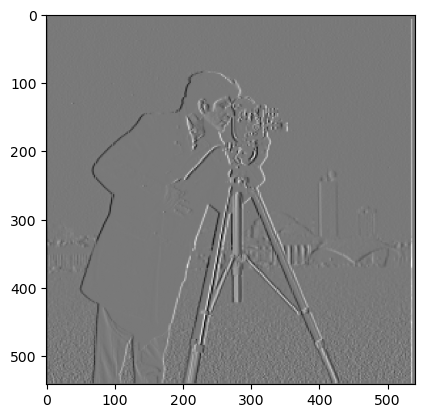

In [ ]:
cam_dx = convolve2d(cam_img, D_x, 'same', 'symm')
plt.imshow(cam_dx, cmap='gray')
plt.axis('off')
plt.show()

In [49]:
save_image(OUTS['p1_2']/'cam_dx.jpg', vis_derivative(cam_dx))

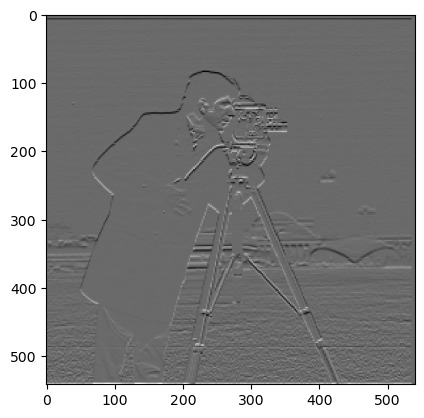

In [ ]:
cam_dy = convolve2d(cam_img, D_y, 'same', 'symm')
plt.imshow(cam_dy, cmap='gray')
plt.axis('off')
plt.show()

In [52]:
save_image(OUTS['p1_2']/'cam_dy.jpg', vis_derivative(cam_dy))

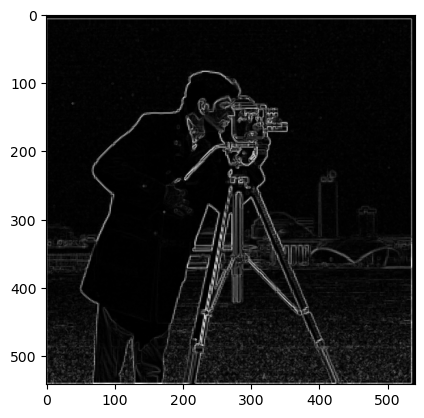

In [ ]:
cam_edge = np.hypot(cam_dx, cam_dy)
plt.imshow(cam_edge, cmap='gray')
plt.axis('off')
plt.show()

In [ ]:
save_image(OUTS['p1_2']/'cam_edge_noise.jpg', cam_edge)

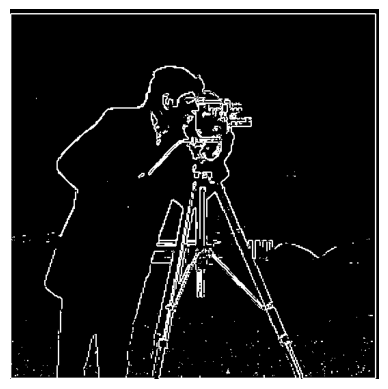

In [54]:
T = 0.25
cam_bin = (cam_edge >= T)
plt.imshow(cam_bin, cmap='gray')
plt.axis('off')
plt.show()

In [55]:
save_image(OUTS['p1_2']/'cam_edge_binarize.jpg', cam_bin * 255)

### 1.3 DoG (Derivative of Gaussian)


In [5]:
gaussian_1d = getGaussianKernel(ksize=15, sigma=2)
gaussian_2d = gaussian_1d @ gaussian_1d.T

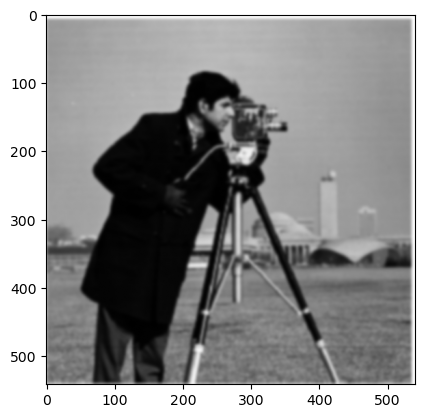

In [ ]:
cam_dog = convolve2d(cam_img, gaussian_2d, 'same', 'symm')
plt.imshow(cam_dog, cmap='gray')
plt.axis('off')
plt.show()

In [19]:
dxog = convolve2d(gaussian_2d, D_x, 'same', 'symm')
dyog = convolve2d(gaussian_2d, D_y, 'same', 'symm')

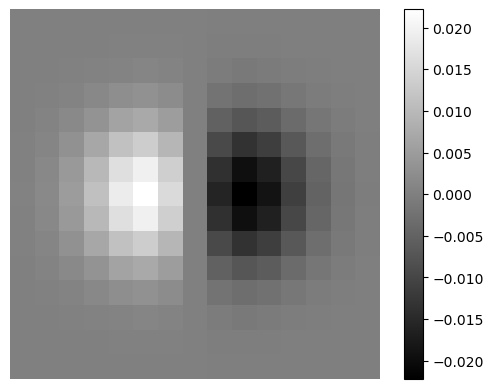

In [63]:
plt.imshow(dxog, cmap='gray')
plt.axis('off')
plt.colorbar()
plt.show()

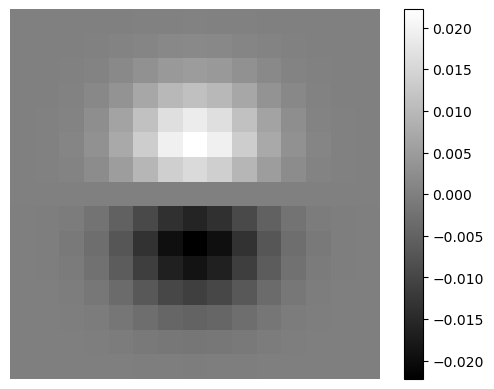

In [59]:
plt.imshow(dyog, cmap='gray')
plt.axis('off')
plt.colorbar()
plt.show()

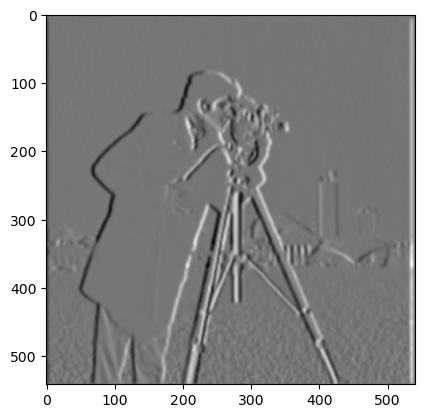

In [ ]:
cam_dxog = convolve2d(cam_img, dxog, 'same', 'symm')
plt.imshow(cam_dxog, cmap='gray')
plt.axis('off')
plt.show()

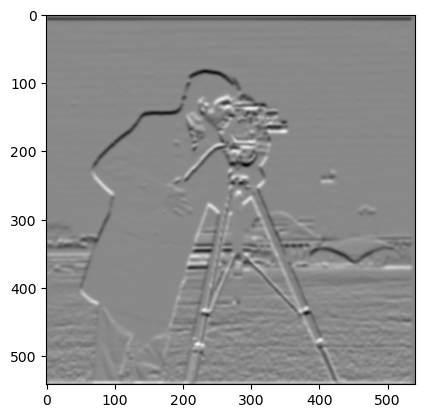

In [ ]:
cam_dyog = convolve2d(cam_img, dyog, 'same', 'symm')
plt.imshow(cam_dyog, cmap='gray')
plt.axis('off')
plt.show()

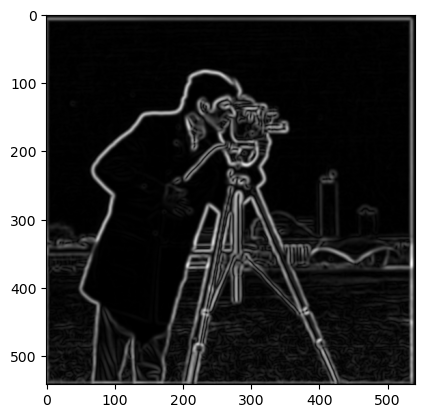

In [ ]:
cam_dog = np.hypot(cam_dxog, cam_dyog)
plt.imshow(cam_dog, cmap='gray')
plt.axis('off')
plt.show()

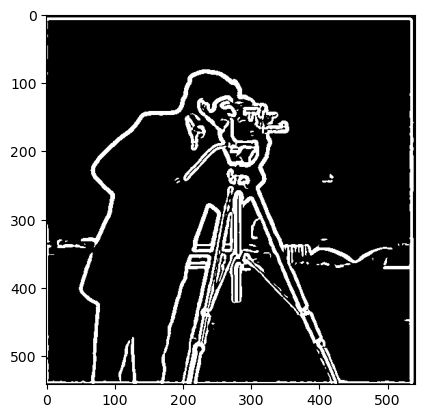

In [ ]:
T = 0.08
cam_dog_bin = (cam_dog >= T)
plt.imshow(cam_dog_bin, cmap='gray')
plt.axis('off')
plt.show()

In [56]:
save_image(OUTS['p1_3']/'cam_dog_binarize.jpg', cam_dog_bin * 255)

## 2. Part 2: Fun with Frequencies


### 2.1 Image Sharpening

In [20]:
gaussian_1d = getGaussianKernel(ksize=15, sigma=2)
gaussian_2d = gaussian_1d @ gaussian_1d.T

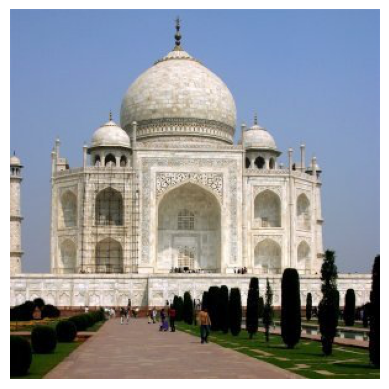

In [7]:
taj_img_path = INP/'taj.jpg'
taj_img = imread_color(taj_img_path)
plt.imshow(taj_img)
plt.axis('off')
plt.show()

In [15]:
taj_img[:,:,0].shape

(300, 300)

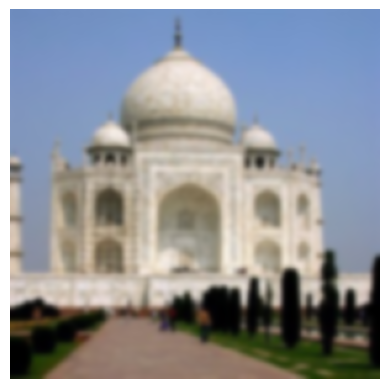

In [17]:
taj_blur = np.dstack([convolve2d(taj_img[:,:,i], gaussian_2d, 'same', 'symm') for i in range(3)])
plt.imshow(taj_blur)
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5913839039944306..0.5269929370911413].


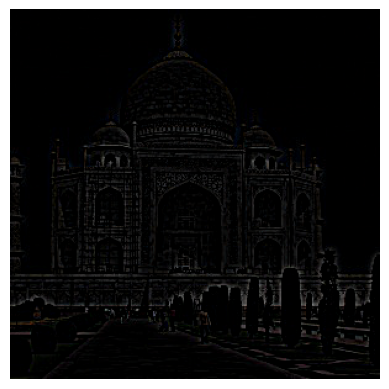

In [22]:
taj_dif = taj_img - taj_blur
plt.imshow(taj_dif)
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7349360243209289..2.569666444328156].


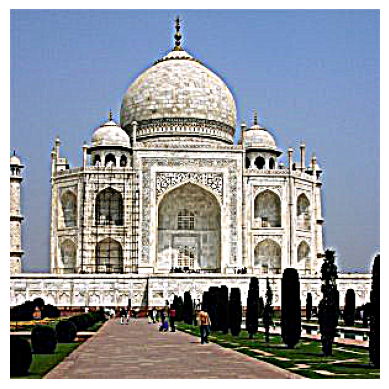

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-3.5090877363042208..4.142349780578311].


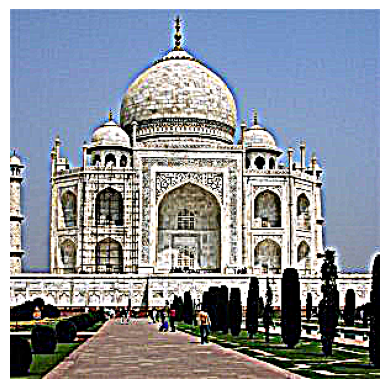

In [ ]:
alpha = [3, 6]
for a in alpha:
    taj_sharp = taj_img + a * taj_dif
    plt.imshow(taj_sharp)
    plt.axis('off')
    plt.show()
    save_image(OUTS['p2_1']/f'taj_sharp_{a}.jpg', taj_sharp)

In [ ]:
save_image(OUTS['p2_1']/'taj_blurred.jpg', taj_blur)
save_image(OUTS['p2_1']/'taj_high_freq.jpg', taj_dif)


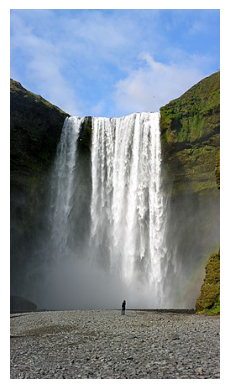

In [16]:
view_img_path = INP/'view.jpg'
view_img = imread_color(view_img_path)
plt.imshow(view_img)
plt.axis('off')
plt.show()

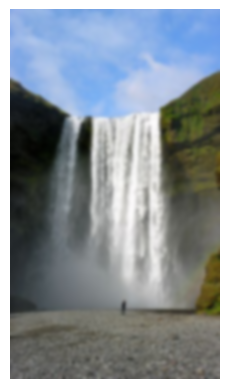

In [21]:
view_blur = np.dstack([convolve2d(view_img[:,:,i], gaussian_2d, 'same', 'symm') for i in range(3)])
plt.imshow(view_blur)
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5897466736699911..0.5275302489080709].


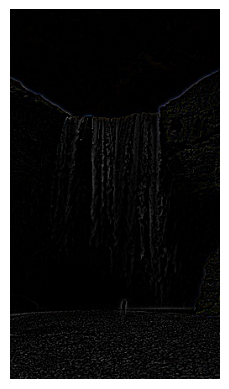

In [22]:
view_dif = view_img - view_blur
plt.imshow(view_dif)
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5662172614451023..1.5079224069395345].


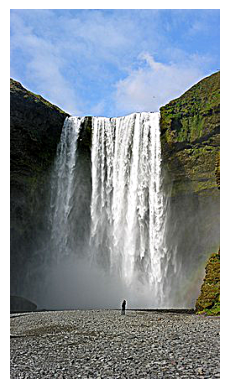

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7457106087850844..2.5629829047556765].


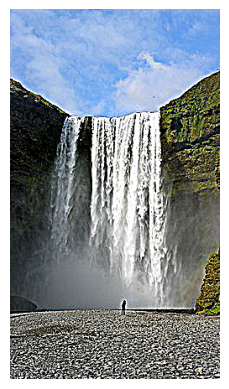

In [24]:
alpha = [1, 3]
for a in alpha:
    view_sharp = view_img + a * view_dif
    plt.imshow(view_sharp)
    plt.axis('off')
    plt.show()
    save_image(OUTS['p2_1']/f'view_sharp_{a}.jpg', view_sharp)

In [25]:
save_image(OUTS['p2_1']/'view_blurred.jpg', view_blur)
save_image(OUTS['p2_1']/'view_high_freq.jpg', view_dif)

In [9]:
gaussian_1d_10 = getGaussianKernel(ksize=15, sigma=1)
g10 = gaussian_1d_10 @ gaussian_1d_10.T

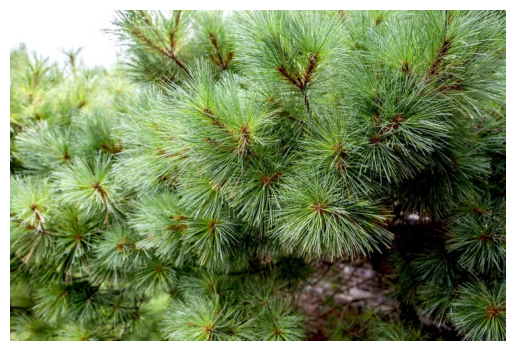

In [10]:
cat_img_path = INP/'tree.jpeg'
cat_img = imread_color(cat_img_path)
plt.imshow(cat_img)
plt.axis('off')
plt.show()

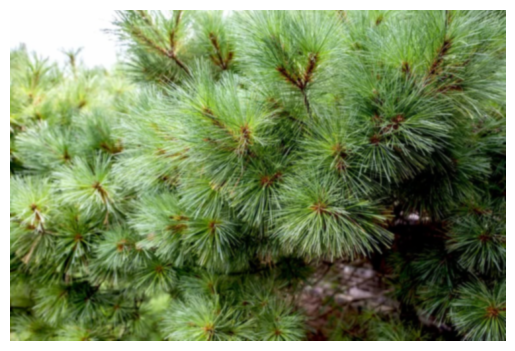

In [11]:
cat_blur = np.dstack([convolve2d(cat_img[:,:,i], g10, 'same', 'symm') for i in range(3)])
plt.imshow(cat_blur)
plt.axis('off')
plt.show()

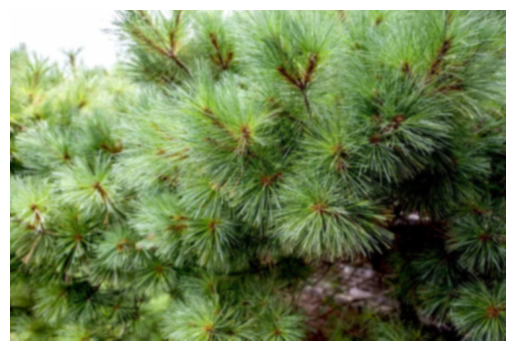

In [12]:
cat_b_blur = np.dstack([convolve2d(cat_blur[:,:,i], g10, 'same', 'symm') for i in range(3)])
plt.imshow(cat_b_blur)
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.10435914478788616..0.09986002493348306].


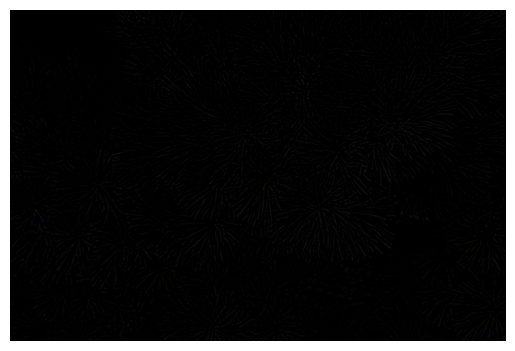

In [13]:
cat_dif = cat_blur - cat_b_blur
plt.imshow(cat_dif, cmap='gray')
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.4803823613226442..1.3127636253555384].


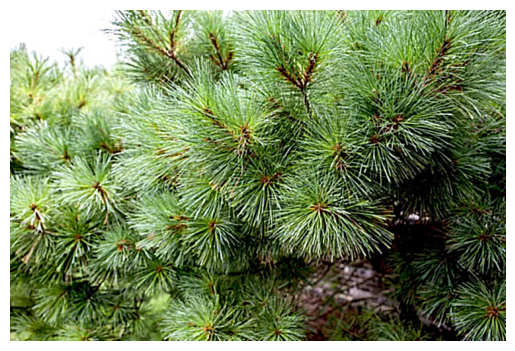

In [29]:
alpha = [6]
for a in alpha:
    cat_sharp = cat_blur + a * cat_dif
    plt.imshow(cat_sharp)
    plt.axis('off')
    plt.show()

In [30]:
save_image(OUTS['p2_1']/'tree_blurred.jpg', cat_blur)
save_image(OUTS['p2_1']/'tree_sharp.jpg', cat_sharp)

### 2.2 Hybrid Images (with FFTs)


#### 2.2.1 Derek & Nutmeg

In [25]:
def low_pass(img, sigma=10):
    return np.dstack(
    [gaussian_filter(img[:,:,i], sigma=sigma, mode='reflect') for i in range(3)]
)

def high_pass(img, sigma=10):
    return img - np.dstack(
    [gaussian_filter(img[:,:,i], sigma=sigma, mode='reflect') for i in range(3)]
)

In [104]:
def img_filter(img, sigma=5, is_high=True, axis_off=True):
    img_filtered = np.dstack(
        [gaussian_filter(img[:,:,i], sigma=sigma, mode='reflect') for i in range(3)]
    )
    if is_high:
        img_filtered = img - img_filtered

    plt.imshow(img_filtered)
    if axis_off:
        plt.axis('off')
    plt.show()

    return img_filtered

In [14]:
%matplotlib inline

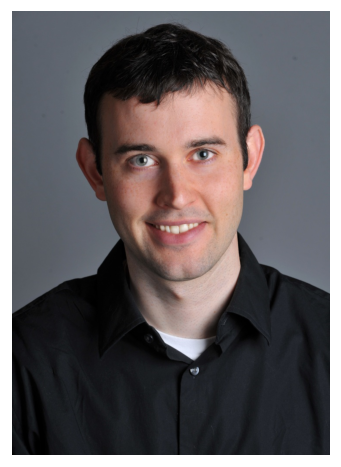

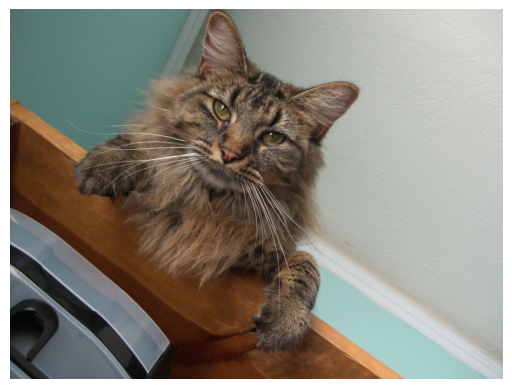

In [6]:
derek_img_path = INP/'DerekPicture.jpg'
derek_img = img_import(derek_img_path)

nut_img_path = INP/'nutmeg.jpg'
nut_img = img_import(nut_img_path)


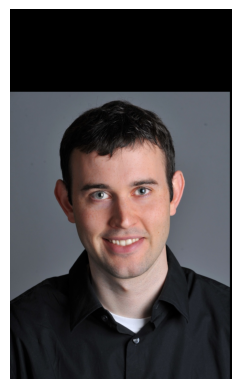

In [3]:
derek_aligned_path = OUTS['p2_2']/'DerekPicture_aligned.png'
derek_aligned = img_import(derek_aligned_path)

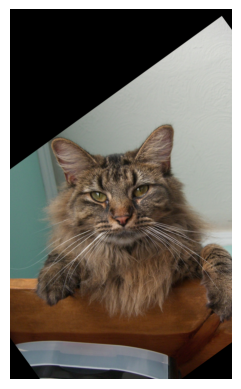

In [4]:
nut_aligned_path = OUTS['p2_2']/'nutmeg_aligned.png'
nut_aligned = img_import(nut_aligned_path)

In [4]:
def low_pass(img, sigma=10):
    return np.dstack(
    [gaussian_filter(img[:,:,i], sigma=sigma, mode='reflect') for i in range(3)]
)

def high_pass(img, sigma=10):
    return img - np.dstack(
    [gaussian_filter(img[:,:,i], sigma=sigma, mode='reflect') for i in range(3)]
)

In [125]:

low = np.dstack(
    [gaussian_filter(derek_aligned[:,:,i], sigma=10, mode='reflect') for i in range(3)]
)
high = nut_aligned - np.dstack(
    [gaussian_filter(nut_aligned[:,:,i], sigma=10, mode='reflect') for i in range(3)]
)
hybrid = low + high

In [126]:
# 1) detect with a wider band and a slightly more selective Canny
mask = seam_mask_hough(high, canny_lo=0.02, canny_hi=0.08, thickness=24)

# 2) dilate more and use a looser cutoff before inpainting
mask_wide = dilation((mask > 0.2).astype(np.uint8), disk(10)).astype(np.float32)

# 3) inpaint with a looser threshold so more pixels get filled
high_fixed = inpaint_masked(high, mask_wide, thresh=0.20)




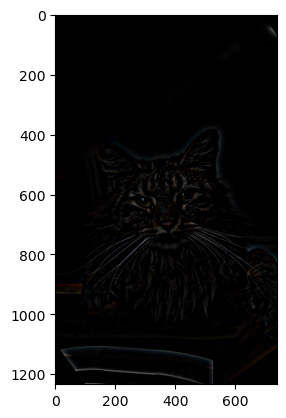

In [127]:
plt.imshow(high_fixed)
plt.show()

In [128]:
high_edit = zero_out_bounds(high_fixed, bottom=1050)

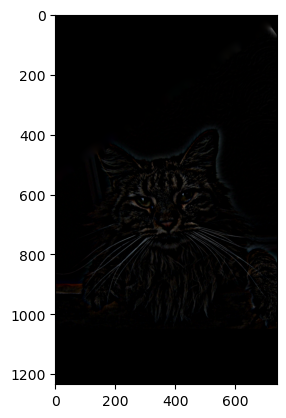

In [129]:
plt.imshow(high_edit)
plt.show()

In [130]:
hybrid_fixed = low + high_edit

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.276734].


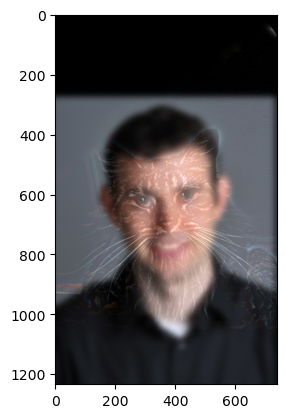

In [131]:
plt.imshow(hybrid_fixed)
#plt.axis('off')
plt.show()

In [132]:
hybrid_edit = crop_bounds(img=hybrid_fixed, top=280, right=720)

In [133]:
hybrid_edit.shape

(954, 720, 3)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00797497..1.276734].


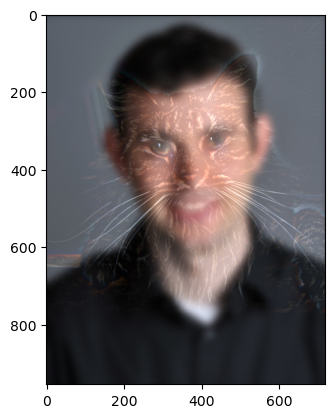

In [134]:
plt.imshow(hybrid_edit)
#plt.axis('off')
plt.show()

In [135]:
save_image(OUTS['p2_2']/'hybrid10.jpg', hybrid_edit)

#### 2.2.2 Sauber & Tractor

In [83]:
import numpy as np
import matplotlib.pyplot as plt

# --- small utilities ---
def _to_gray(x):
    return x if x.ndim == 2 else (0.299*x[...,0] + 0.587*x[...,1] + 0.114*x[...,2])

def _fft_logmag(im2d):
    F = np.fft.fftshift(np.fft.fft2(im2d))
    return np.log1p(np.abs(F))  # stable log magnitude

# --- pair: Original vs Low/High ---
def show_fft_pair_named(orig, other, kind="low", name="tractor.png", cmap="RdBu_r"):
    """
    kind = 'low'  (as-is)  |  'high' (mean-removed to suppress DC)
    """
    go = _fft_logmag(_to_gray(orig))
    o2 = _to_gray(other)
    if kind == "high":
        o2 = o2 - o2.mean()
    g2 = _fft_logmag(o2)

    vmin = min(go.min(), g2.min())
    vmax = max(go.max(), g2.max())

    fig, axs = plt.subplots(1, 2, figsize=(10, 4), constrained_layout=True)
    fig.suptitle(f"Log Mag FFT of '{name}'", fontsize=16, weight="bold")

    im0 = axs[0].imshow(go, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[0].set_title("Original (FFT)"); axs[0].axis("off")

    im1 = axs[1].imshow(g2, cmap=cmap, vmin=vmin, vmax=vmax)
    axs[1].set_title(f"{kind.capitalize()} (FFT)"); axs[1].axis("off")

    cbar = fig.colorbar(im1, ax=axs, fraction=0.03)
    plt.show()

# --- single: one image (e.g., blended) ---
def show_fft_single(img, name="blended.png", cmap="RdBu_r"):
    g = _fft_logmag(_to_gray(img))
    fig, ax = plt.subplots(figsize=(7, 4), constrained_layout=True)
    ax.set_title(f"Log Mag FFT of '{name}'", fontsize=16, weight="bold")
    im = ax.imshow(g, cmap=cmap)
    ax.axis("off")
    fig.colorbar(im, ax=ax, fraction=0.04)
    plt.show()


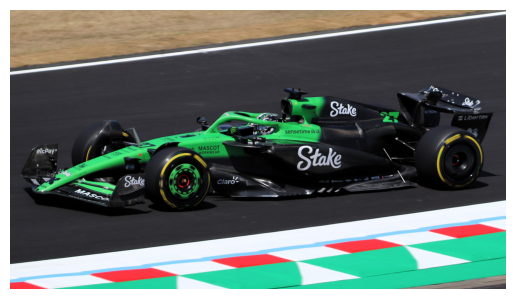

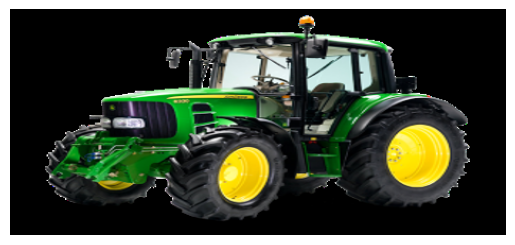

In [9]:
sauber_path = INP/'sauber.jpg'
sauber_img = img_import(sauber_path)

tractor_path = INP/'tractor.png'
tractor_img = img_import(tractor_path)

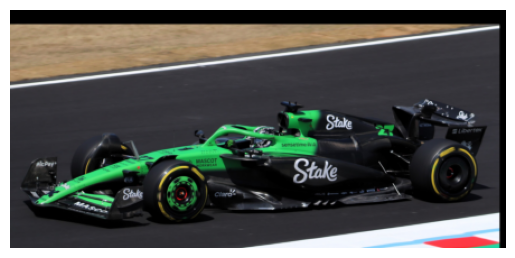

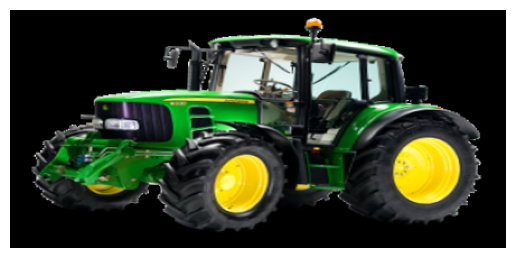

In [10]:
sauber_aligned_path = OUTS['p2_2']/'sauber_aligned.png'
sauber_aligned = img_import(sauber_aligned_path)

tractor_aligned_path = OUTS['p2_2']/'tractor_aligned.png'
tractor_aligned = img_import(tractor_aligned_path)

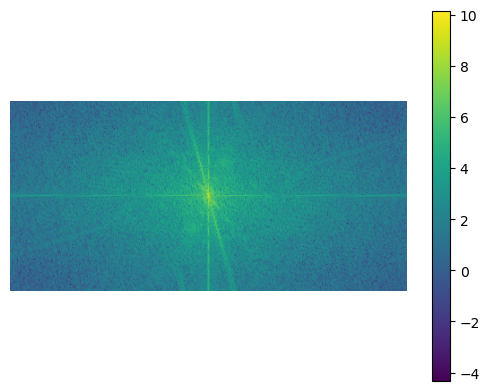

In [75]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(sauber_aligned[:,:,1])))))
plt.colorbar()
plt.axis('off')
plt.show()


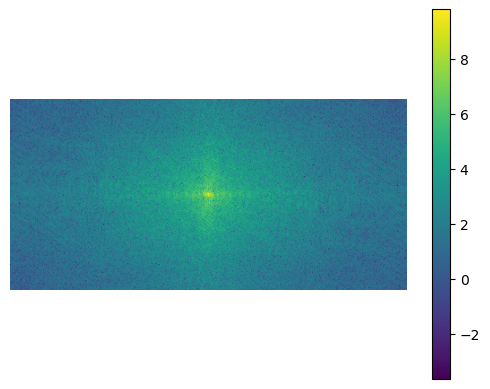

In [76]:
plt.imshow(np.log(np.abs(np.fft.fftshift(np.fft.fft2(tractor_aligned[:,:,1])))))
plt.colorbar()
plt.axis('off')
plt.show()

In [40]:
save_image(tractor_aligned_path, tractor_aligned)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.49069512..0.7110251].


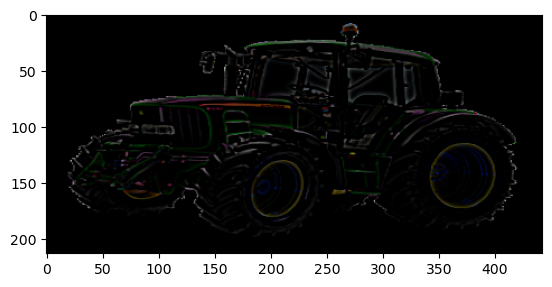

In [49]:
tractor_high = tractor_aligned - np.dstack(
    [gaussian_filter(tractor_aligned[:,:,i], sigma=2, mode='reflect') for i in range(3)]
)
plt.imshow(tractor_high)
plt.show()

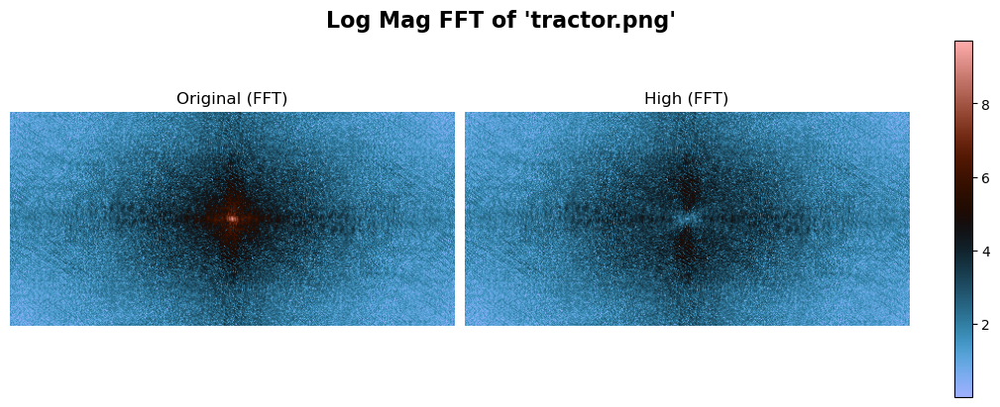

In [85]:
show_fft_pair_named(tractor_aligned, tractor_high, kind="high", name="tractor.png", cmap="berlin")

In [97]:
save_image(OUTS['p2_2']/'tractor_high.png', tractor_high)

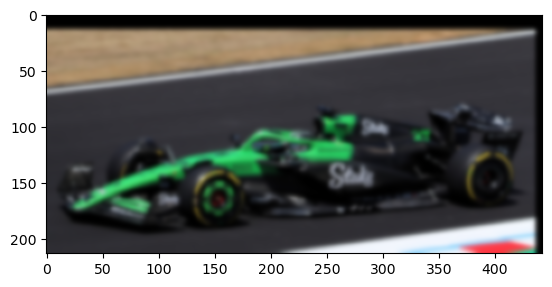

In [78]:
sauber_low = img_filter(sauber_aligned, is_high=False, axis_off=False, sigma=2)

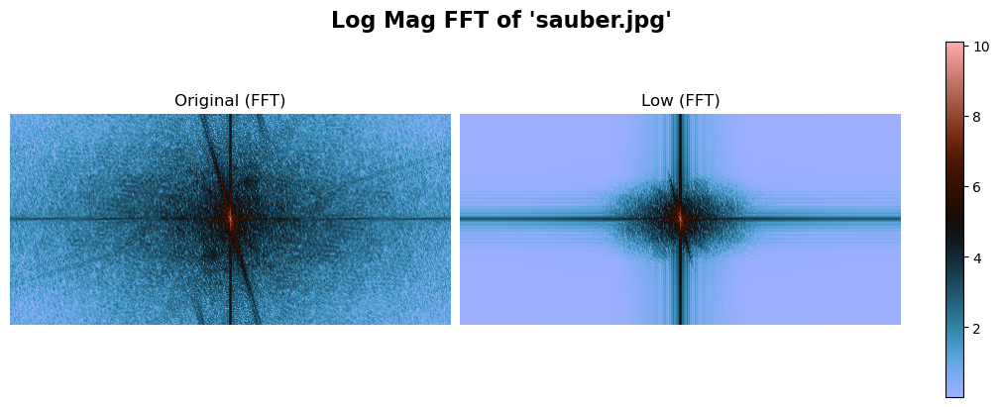

In [95]:
show_fft_pair_named(sauber_aligned, sauber_low, kind="low", name="sauber.jpg", cmap="berlin")

In [98]:
save_image(OUTS['p2_2']/'sauber_low.png', sauber_low)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.30449367..1.3840497].


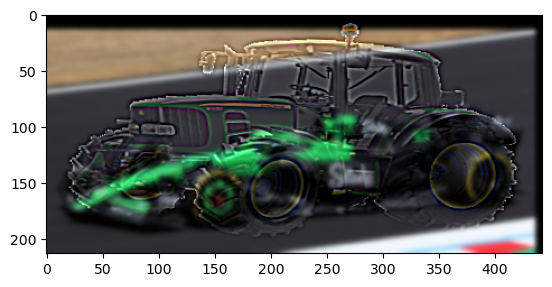

In [88]:
car_hybrid = sauber_low + tractor_high
img_show(car_hybrid, axis_off=False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.27294466..1.3840497].


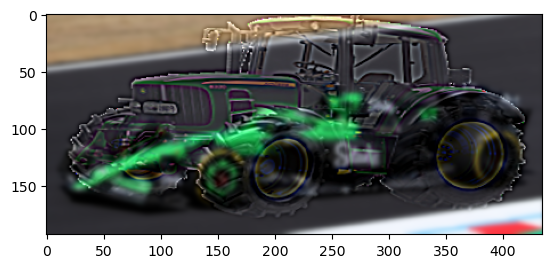

In [92]:
car_cropped = crop_bounds(car_hybrid, top=20, right=435)
img_show(car_cropped, axis_off=False)

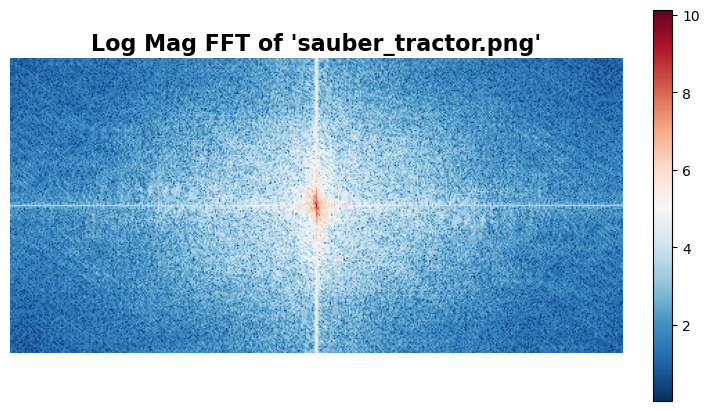

In [87]:
show_fft_single(car_hybrid, name="sauber_tractor.png")

In [96]:
save_image(OUTS['p2_2']/'sauber_tractor.png', car_cropped)

In [7]:
sauber_img.shape

(1440, 2560, 3)

In [8]:
tractor_img.shape

(462, 642, 3)

#### 2.2.3 Binotto & Clown

In [221]:
import numpy as np
from skimage.morphology import dilation, disk

def _zero_mean_per_channel(img: np.ndarray):
    """Return (img_zero_mean, per-channel mean)."""
    if img.ndim == 3:
        mu = img.mean(axis=(0,1), keepdims=True)
    else:
        mu = np.array([[img.mean()]], dtype=img.dtype)
    return img - mu, mu

def _add_mean(img: np.ndarray, mu: np.ndarray):
    return img + mu

def remove_two_seams_highpass(
    hi: np.ndarray,
    # detection params (same for both passes; override per-pass if you want)
    canny_lo=0.02, canny_hi=0.08, thickness=14,
    # mask widening
    cutoff=0.40, dilate_radius=5,
    # inpaint control
    inpaint_thresh=0.30,
    # run count
    passes=2,
    return_masks=False
):
    """
    Zero-mean the high-pass, detect & inpaint 'passes' seams, then add mean back.
    Returns the fixed image (and masks list if return_masks=True).
    """
    hi = hi.astype(np.float32, copy=False)
    z, mu = _zero_mean_per_channel(hi)

    masks = []
    cur = z
    for _ in range(passes):
        m = seam_mask_hough(cur, canny_lo=canny_lo, canny_hi=canny_hi, thickness=thickness)
        mw = dilation((m > cutoff).astype(np.uint8), disk(dilate_radius)).astype(np.float32)
        cur = inpaint_masked(cur, mw, thresh=inpaint_thresh)
        # keep it zero-mean after each inpaint to avoid drift
        cur, _mu_ = _zero_mean_per_channel(cur)
        if return_masks:
            masks.append(mw)

    out = _add_mean(cur, mu)
    return (out, masks) if return_masks else out

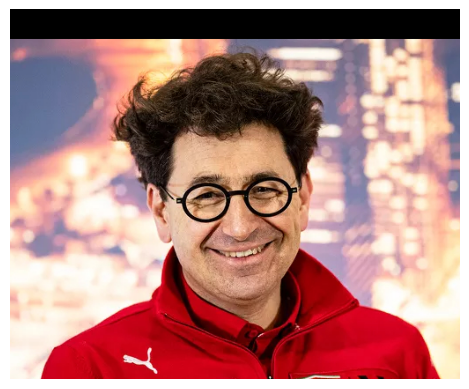

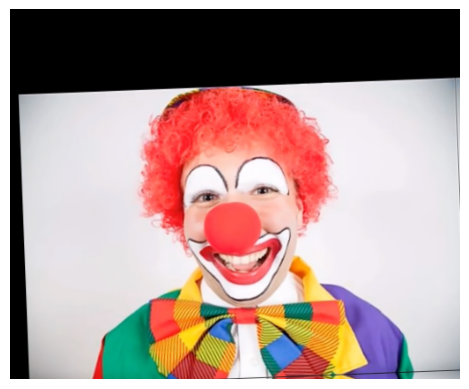

In [142]:
binotto_aligned_path = OUTS['p2_2']/'binotto_aligned.png'
binotto_aligned = img_import(binotto_aligned_path)

clown_aligned_path = OUTS['p2_2']/'clown_aligned.png'
clown_aligned = img_import(clown_aligned_path)

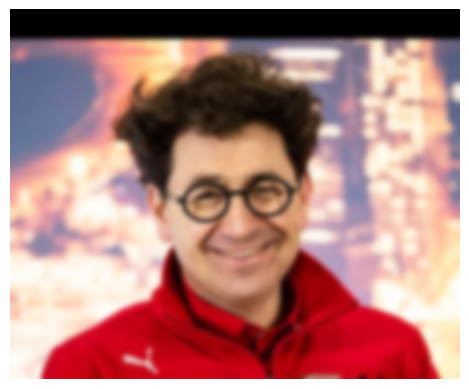

In [192]:
binotto_low = img_filter(binotto_aligned, sigma=3, is_high=False)

In [215]:
save_image(OUTS['p2_2']/'binotto_low.png', binotto_low)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.5031561..0.51486135].


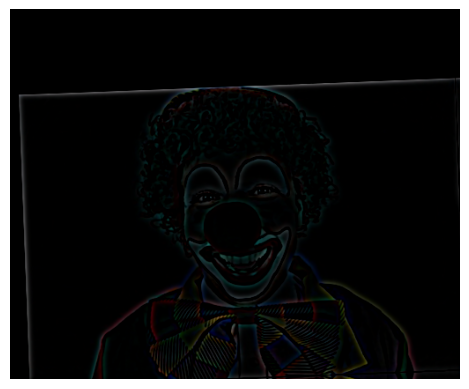

In [198]:
clown_high = img_filter(clown_aligned, sigma=3, is_high=True)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.007587729..0.43088907].


(np.float64(-0.5), np.float64(510.5), np.float64(419.5), np.float64(-0.5))

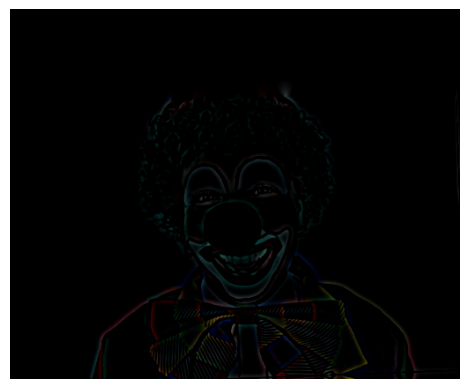

In [209]:

plt.imshow((high_fixed))
plt.axis('off')


In [214]:
save_image(OUTS['p2_2']/'clown_high.png', high_fixed)

/Users/jinchuanli/Documents/Fall 2025/CS 180/proj2/src/line_detection.py:39: FutureWarning: `rectangle` is deprecated since version 0.25 and will be removed in version 0.27. Use `skimage.morphology.footprint_rectangle` instead.
  band = dilation(band, rectangle(3, 3)).astype(np.float32)


(np.float64(-0.5), np.float64(510.5), np.float64(419.5), np.float64(-0.5))

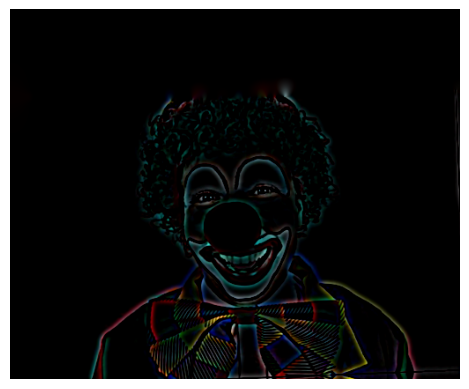

In [212]:
high_fixed, masks = remove_two_seams_highpass(
    clown_high,
    canny_lo=0.02, canny_hi=0.08, thickness=14,
    cutoff=0.40, dilate_radius=5,
    inpaint_thresh=0.30,
    passes=2,
    return_masks=True
)

high_fix2 =(high_fixed - high_fixed.min())/(high_fixed.max()-high_fixed.min()+1e-8)
plt.imshow(high_fix2)
plt.axis('off')


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.7673764].


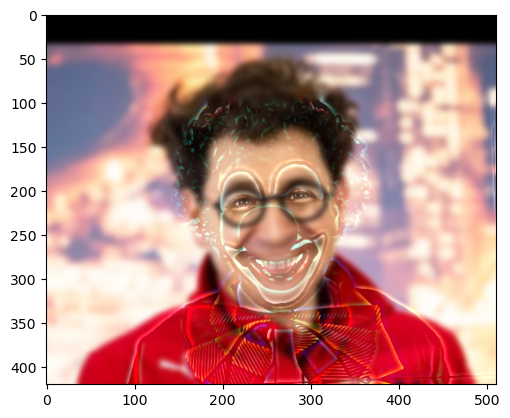

In [216]:
hybrid = binotto_low + high_fixed2
plt.imshow(hybrid)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.00028971225..1.7673764].


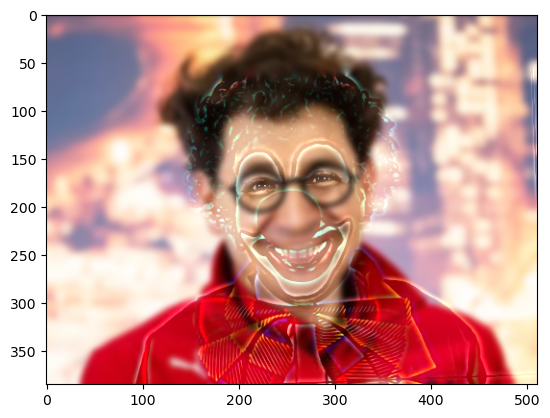

In [219]:
hybrid_crop = crop_bounds(hybrid, top=35)
plt.imshow(hybrid_crop)

In [220]:
save_image(OUTS['p2_2']/'binotto_clown.png', hybrid_crop)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.2828498].


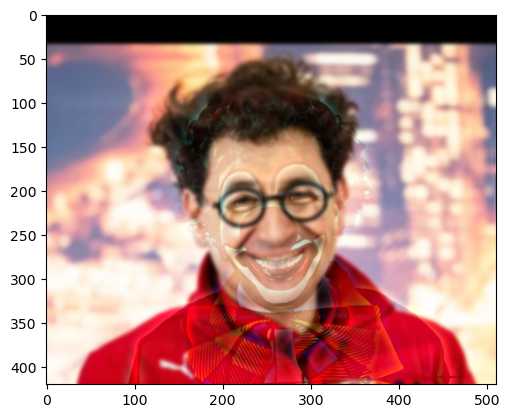

In [176]:
hybrid = binotto_low + high_fixed2
plt.imshow(hybrid)

In [167]:
save_image(OUTS['p2_2']/'binotto_clown.png', hybrid)

In [ ]:
# 1) detect with a wider band and a slightly more selective Canny
mask = seam_mask_hough(high, canny_lo=0.02, canny_hi=0.08, thickness=24)

# 2) dilate more and use a looser cutoff before inpainting
mask_wide = dilation((mask > 0.2).astype(np.uint8), disk(10)).astype(np.float32)

# 3) inpaint with a looser threshold so more pixels get filled
high_fixed = inpaint_masked(high, mask_wide, thresh=0.20)

### 2.3 Gaussian & Laplacian Stacks


In [222]:
def gaussian_stack(img, levels=8, sigma=2):
    gstack = [img]
    for i in range(levels):
        img = low_pass(img, sigma=sigma)
        gstack.append(img)
    
    return gstack

def laplacian_stack(img, levels=8, sigma=2):
    gstack = gaussian_stack(img, levels=levels, sigma=sigma)
    lstack = []
    for i in range(1, len(gstack)):
        lstack.append(
            np.dstack(
                [gstack[i - 1][:,:,j] - gstack[i][:,:,j] for j in range(3)]
            )
        )
    lstack.append(gstack[-1])
    return lstack, gstack

def gaussian_stack_mask(mask2d: np.ndarray, levels=8, sigma=2.0):
    g = [mask2d]
    cur = g[0]
    for _ in range(levels):
        cur = gaussian_filter(cur, sigma=sigma, mode='reflect')
        g.append(cur)
    return g

def multires_blend(A: np.ndarray, B: np.ndarray, M2d: np.ndarray, levels=8, sigma=2.0):
    """
    A, B: HxWx3 (aligned). M2d: HxW in [0,1], where 1 picks A and 0 picks B.
    Returns blended image (float32) in the same numeric scale as inputs.
    """
    # 1) Build stacks
    LA, GA = laplacian_stack(A, levels=levels, sigma=sigma)   # LA: len=levels+1, last=GA[-1]
    LB, GB = laplacian_stack(B, levels=levels, sigma=sigma)
    GM     = gaussian_stack_mask(M2d.astype(np.float32), levels=levels, sigma=sigma)  # len=levels+1

    # 2) Per-level blend for the band-pass levels
    blended_bands = []
    for i in range(levels):               # 0..levels-1 are Laplacian bands
        m = GM[i][..., None]              # (H,W) -> (H,W,1) to broadcast over RGB
        Li = m * LA[i] + (1.0 - m) * LB[i]
        blended_bands.append(Li)

    # 3) Final very low-pass level (Gaussian)
    mK   = GM[-1][..., None]
    last = mK * GA[-1] + (1.0 - mK) * GB[-1]

    # 4) Reconstruct
    out = np.sum(blended_bands, axis=0) + last
    return out.astype(np.float32)

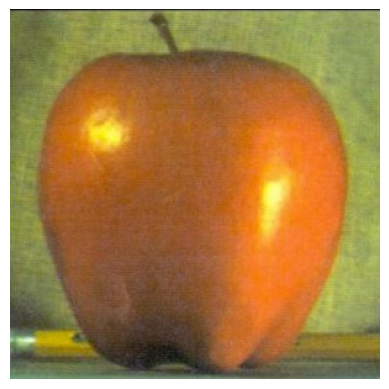

In [239]:
apple_path = INP/'apple.jpeg'
apple_img = img_import(apple_path)

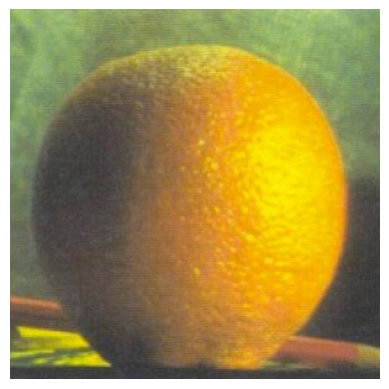

In [240]:
orange_path = INP/'orange.jpeg'
orange_img = img_import(orange_path)

In [241]:
mask_left = np.ones((300, 300), dtype=np.float32)
mask_left[:, 300//2:] = 0.0
mask_left_stack = gaussian_stack_mask(mask_left, levels=8, sigma=4.0)

(np.float64(-0.5), np.float64(299.5), np.float64(299.5), np.float64(-0.5))

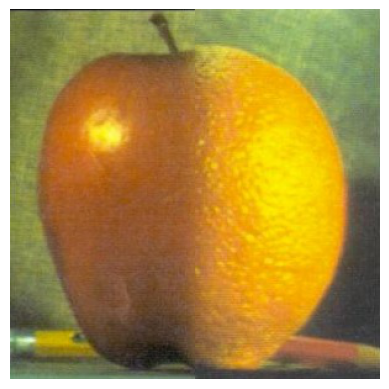

In [ ]:
# Binary left/right mask (2-D)
H, W = 300, 300
mask = np.ones((H,W), np.float32)
mask_left  = zero_out_bounds(mask, right=W//2)  # left=1, right=0

# Stacks
LA, GA = laplacian_stack(apple_img, 8, 4.0)
LB, GB = laplacian_stack(orange_img, 8, 4.0)
GM = mask_left_stack
# GM     = mask_stack_gaussian(mask_left, levels=8, sigma_step=2.0)

# Per-level blend
A_levels = []
B_levels = []
for i in range(8):  # band-pass levels
    m = GM[i][..., None]
    A_levels.append(m * LA[i])
    B_levels.append((1 - m) * LB[i])


# Last Gaussian level
mK   = GM[-1][..., None]
A_levels.append(mK*GA[-1])
B_levels.append((1-mK)*GB[-1])

out = np.clip(sum(A_levels) + sum(B_levels), 0, 1)
plt.imshow(out); plt.axis('off')


In [243]:
C_levels = [A_levels[i] + B_levels[i] for i in range(len(A_levels))]

In [37]:
save_image(OUTS['p2_3']/'fruit/apple_orange.jpg', out)

In [ ]:
apple_lstack = laplacian_stack(apple_img)


In [ ]:
orange_lstack = laplacian_stack(orange_img)

In [28]:
mask_left = np.ones((300, 300), dtype=np.float32)
mask_left[:, W//2:] = 0.0
mask_left_stack = gaussian_stack_mask(mask_left, levels=8, sigma=4.0)

In [19]:
mask_left = [mask_left_stack[i][:,:,0] for i in range(len(mask_left_stack))]

In [194]:
blend_levels = []
for i in range(8):  # only the band-pass levels
    mL = mask_left_stack[i][..., None]   # broadcast to RGB if needed
    # apple on the left, orange on the right
    blend_levels.append(mL * apple_lstack[i] + (1 - mL) * orange_lstack[i])

In [197]:
fruit_blend = np.sum(blend_levels, axis=0)

In [195]:
blend_levels[1]

array([[[0.06233474, 0.0748444 , 0.04563649],
        [0.06955856, 0.08208004, 0.05035519],
        [0.07305794, 0.08471536, 0.0524058 ],
        ...,
        [0.08856426, 0.10469323, 0.07734227],
        [0.08245785, 0.09669095, 0.07179148],
        [0.07192308, 0.08372859, 0.06248011]],

       [[0.07009611, 0.08339071, 0.05061749],
        [0.07737678, 0.09018363, 0.05520697],
        [0.08027606, 0.0917125 , 0.05679745],
        ...,
        [0.1001351 , 0.1185486 , 0.08673109],
        [0.09402461, 0.11035815, 0.08120488],
        [0.08257598, 0.09618282, 0.07117122]],

       [[0.07511084, 0.08857443, 0.05313336],
        [0.08246191, 0.09499559, 0.05746792],
        [0.08495077, 0.09572346, 0.05862092],
        ...,
        [0.1055859 , 0.12522212, 0.09051475],
        [0.10018343, 0.11771496, 0.08566746],
        [0.08871646, 0.1034005 , 0.07573209]],

       ...,

       [[0.05458044, 0.06707194, 0.05795433],
        [0.06563039, 0.08279271, 0.06948159],
        [0.07327588, 0

In [168]:
apple_left_lstack = [apple_lstack[i] * mask_left_stack[i] for i in range(8)]

In [169]:
apple_left_lstack[0].shape

(300, 300, 3)

In [155]:
fruit_lstack = np.array([apple_lstack[i] + orange_lstack[i] for i in range(len(apple_lstack))])

In [162]:
fruit_blended = np.sum(fruit_lstack, axis=0)

In [163]:
fruit_blended.shape

(300, 300, 3)

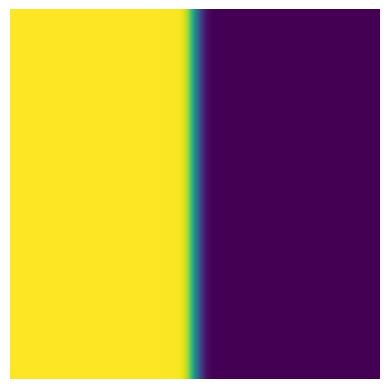

In [25]:
plt.imshow(vis_derivative(mK))
plt.axis('off')
plt.show()

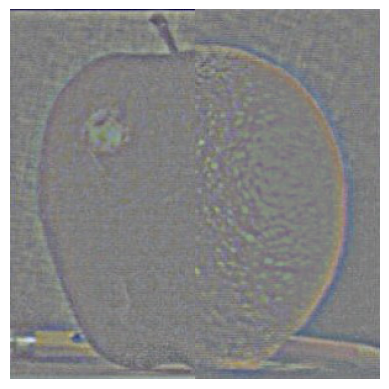

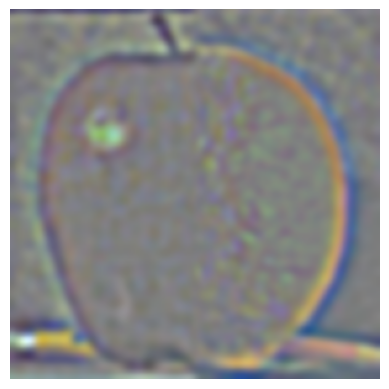

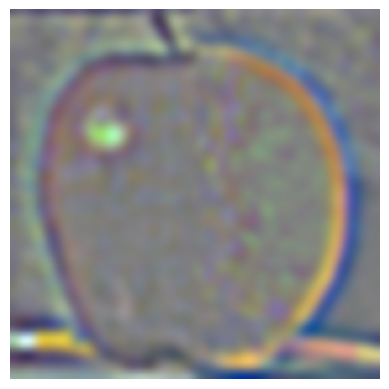

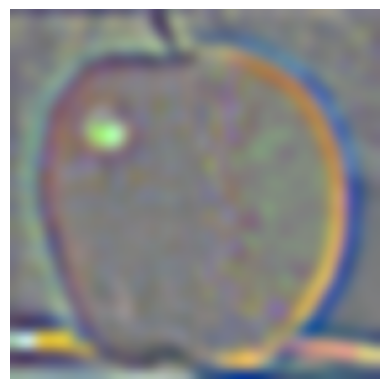

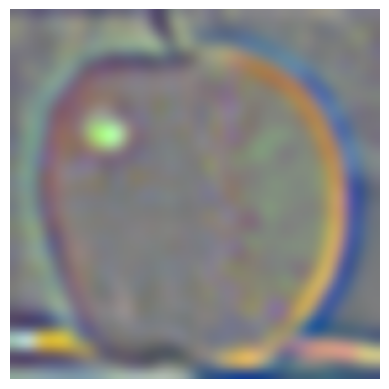

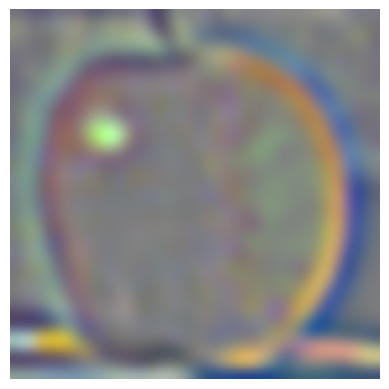

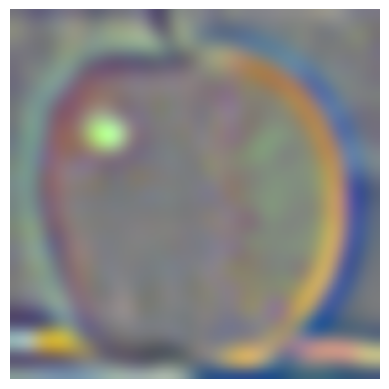

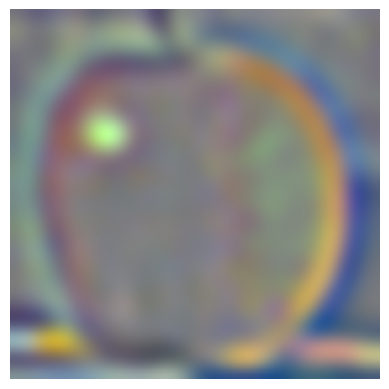

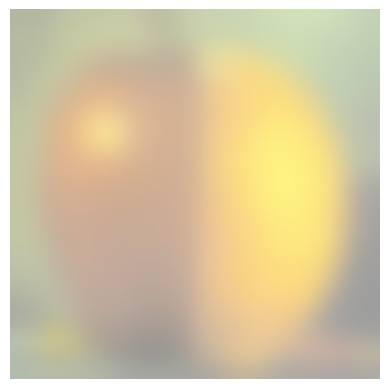

In [245]:
for i in range(9):
    plt.imshow(vis_derivative(C_levels[i]))
    plt.axis('off')
    plt.show()
    save_image(OUTS['p2_3']/f'fruit/matched_level{i}.jpg', vis_derivative(C_levels[i]))


### 2.4 Multiresolution Blending


In [226]:
import numpy as np
from skimage.transform import AffineTransform, warp
from scipy.ndimage import gaussian_filter

def split_png_rgba_to_rgb_and_mask(png_rgba):
    """
    png_rgba: HxWx4 uint8 or float. Returns (rgb float32 in [0,1], mask float32 in [0,1]).
    """
    arr = png_rgba.astype(np.float32)
    if arr.max() > 1.5:  # 0..255
        arr = arr / 255.0
    rgb  = arr[..., :3]
    mask = arr[..., 3]
    return rgb, mask

def place_object_on_bg_canvas(obj_rgb, obj_mask, bg_shape, scale=1.0, angle_deg=0.0, center=None, translate=(0,0), feather=0.0):
    """
    Warp object + mask into a canvas that matches the BACKGROUND size.
    - obj_rgb: h×w×3 float (any range, but 0..1 recommended)
    - obj_mask: h×w float in [0,1]
    - bg_shape: (H, W, 3) or (H, W) — size of the background canvas
    - scale, angle_deg, translate: geometric params for placement
    - center: pivot (x,y) in object coords; default = object center
    - feather: optional Gaussian blur on mask (in px)
    Returns (obj_canvas, mask_canvas) both shaped to background.
    """
    H, W = bg_shape[:2]
    h, w = obj_rgb.shape[:2]

    # pivot for rotation/scaling
    if center is None:
        cx, cy = w/2.0, h/2.0
    else:
        cx, cy = center

    # Build transform: T = T_translate ∘ T_center ∘ T_rotate ∘ T_scale ∘ T_uncenter
    theta = np.deg2rad(angle_deg)
    T = AffineTransform(translation=translate) @ \
        AffineTransform(translation=(cx, cy)) @ \
        AffineTransform(rotation=theta) @ \
        AffineTransform(scale=(scale, scale)) @ \
        AffineTransform(translation=(-cx, -cy))

    # Warp object and mask into background canvas
    ch_axis = -1  # RGB last
    obj_canvas = warp(
        obj_rgb, inverse_map=T.inverse, output_shape=(H, W),
        order=1, mode='constant', cval=0.0, preserve_range=True, channel_axis=ch_axis
    ).astype(np.float32)

    mask_canvas = warp(
        obj_mask, inverse_map=T.inverse, output_shape=(H, W),
        order=1, mode='constant', cval=0.0, preserve_range=True
    ).astype(np.float32)

    if feather > 0:
        mask_canvas = gaussian_filter(mask_canvas, feather)

    # clamp mask to [0,1]
    mask_canvas = np.clip(mask_canvas, 0.0, 1.0)
    return obj_canvas, mask_canvas


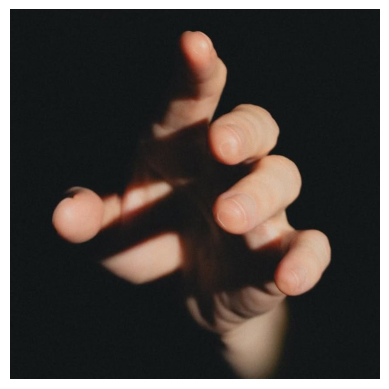

In [224]:
hand_path = INP/'hand.jpg'
hand_img = img_import(hand_path)

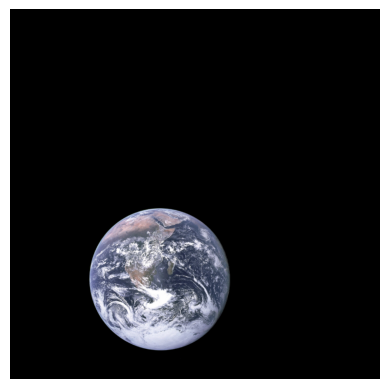

In [225]:
earth_path = INP/'earth.png'
earth_img = img_import(earth_path)

In [313]:
# 1) Load background and PNG with alpha
bg = plt.imread("data/inputs/hand.jpg")
png_rgba = plt.imread("data/inputs/earth.png")   # has alpha

obj_rgb, obj_mask = split_png_rgba_to_rgb_and_mask(png_rgba)


In [314]:
save_image(INP/'hand_earth_mask.jpg', obj_mask)

In [247]:
obj_mask.shape

(845, 845)

In [276]:
obj_mask_stack = gaussian_stack_mask(obj_mask, levels=8, sigma=2.0)

(np.float64(-0.5), np.float64(844.5), np.float64(844.5), np.float64(-0.5))

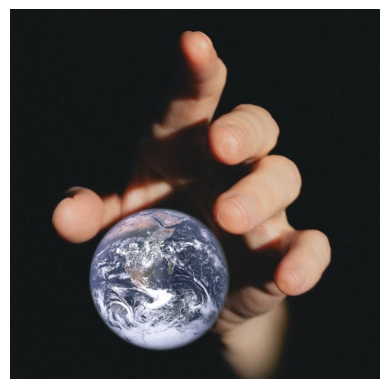

In [278]:
# Binary left/right mask (2-D)
H, W = 845, 845
mask = np.ones((H,W), np.float32)

# Stacks
LA, GA = laplacian_stack(earth_img, 8, 2.0)
LB, GB = laplacian_stack(hand_img, 8, 2.0)
GM = obj_mask_stack
# GM     = mask_stack_gaussian(mask_left, levels=8, sigma_step=2.0)

# Per-level blend
A_levels = []
B_levels = []
for i in range(8):  # band-pass levels
    m = GM[i][..., None]
    A_levels.append(m * LA[i])
    B_levels.append((1 - m) * LB[i])


# Last Gaussian level
mK   = GM[-1][..., None]
A_levels.append(mK*GA[-1])
B_levels.append((1-mK)*GB[-1])

out = np.clip(sum(A_levels) + sum(B_levels), 0, 1)
plt.imshow(out); plt.axis('off')

In [279]:
save_image(OUTS['p2_4']/'hand_earth/hand_earth.jpg', out)

In [280]:
C_levels = [A_levels[i] + B_levels[i] for i in range(len(A_levels))]

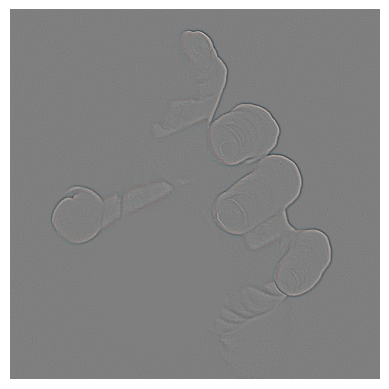

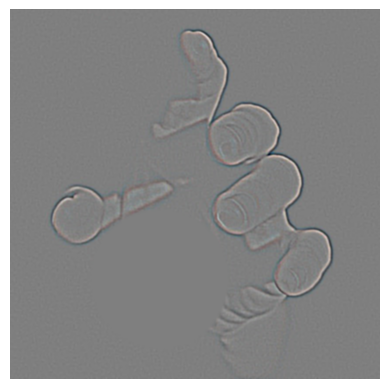

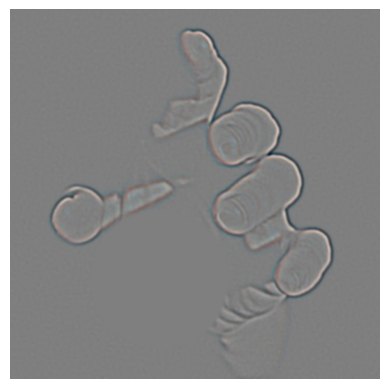

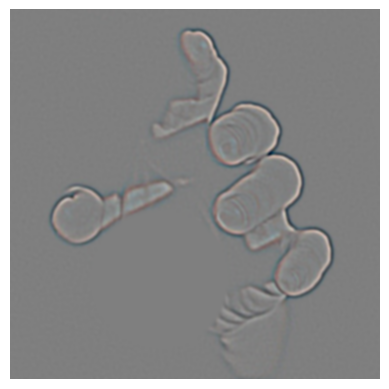

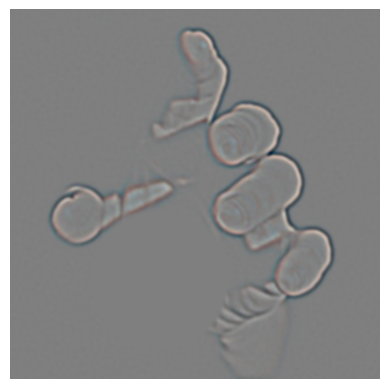

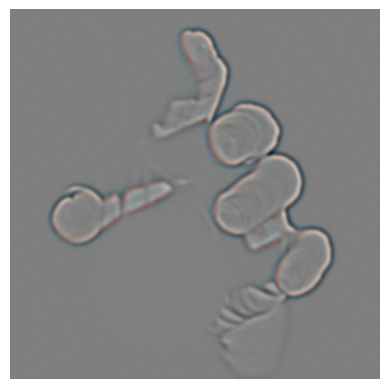

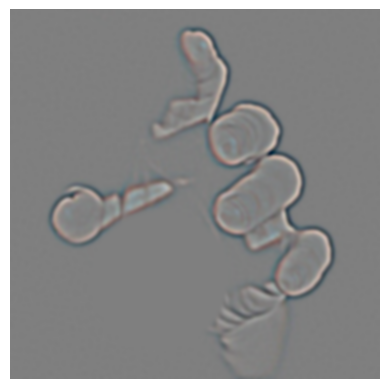

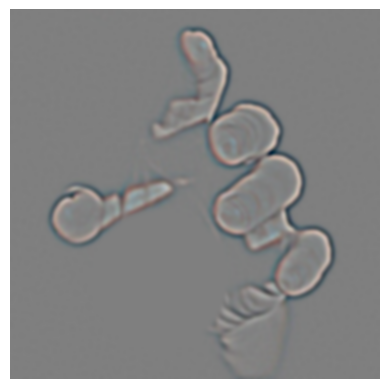

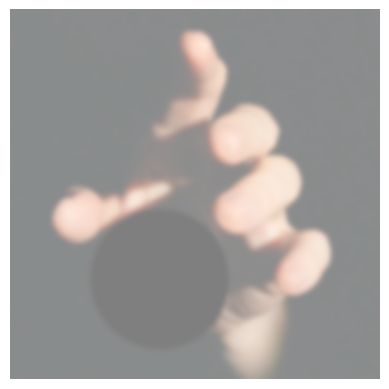

In [283]:
for i in range(9):
    plt.imshow(vis_derivative(B_levels[i]))
    plt.axis('off')
    plt.show()
    save_image(OUTS['p2_4']/f'hand_earth/hand_level{i}.jpg', vis_derivative(B_levels[i]))

#### 2.4.2 Foothill

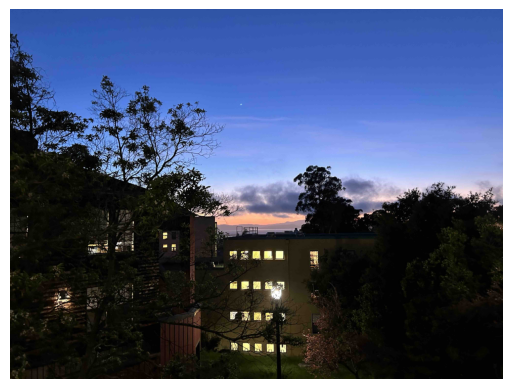

In [260]:
blue_path = INP/'blue.jpeg'
blue_img = img_import(blue_path)

In [299]:
blue_crop = crop_bounds(blue_img, bottom=2966)

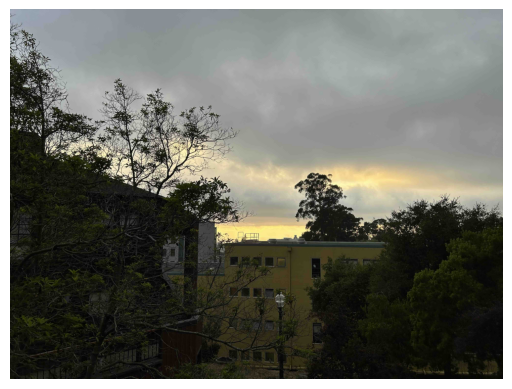

In [300]:
cloudy_path = INP/'cloudy.jpeg'
cloudy_img = img_import(cloudy_path)

In [301]:
cloudy_crop = crop_bounds(cloudy_img, top=58)

In [302]:
blue_crop.shape

(2966, 4032, 3)

In [305]:
mask_left = np.ones((2966, 4032), dtype=np.float32)
mask_left[:, 4032//2:] = 0.0
mask_left_stack = gaussian_stack_mask(mask_left, levels=8, sigma=10.0)

In [306]:
# Binary left/right mask (2-D)
H, W = 2996, 4032
mask = np.ones((H,W), np.float32)
mask_left  = zero_out_bounds(mask, right=W//2)  # left=1, right=0

# Stacks
LA, GA = laplacian_stack(blue_crop, 8, 10.0)
LB, GB = laplacian_stack(cloudy_crop, 8, 10.0)
GM = mask_left_stack
# GM     = mask_stack_gaussian(mask_left, levels=8, sigma_step=2.0)

# Per-level blend
A_levels = []
B_levels = []
for i in range(8):  # band-pass levels
    m = GM[i][..., None]
    A_levels.append(m * LA[i])
    B_levels.append((1 - m) * LB[i])


# Last Gaussian level
mK   = GM[-1][..., None]
A_levels.append(mK*GA[-1])
B_levels.append((1-mK)*GB[-1])

out = np.clip(sum(A_levels) + sum(B_levels), 0, 1)



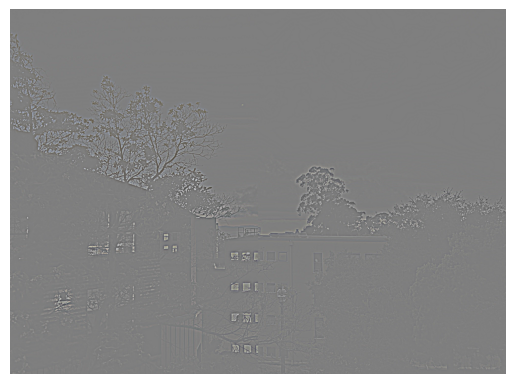

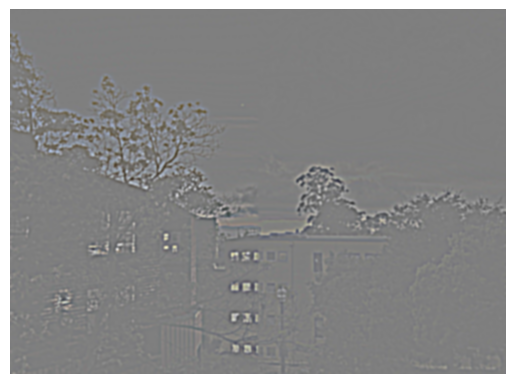

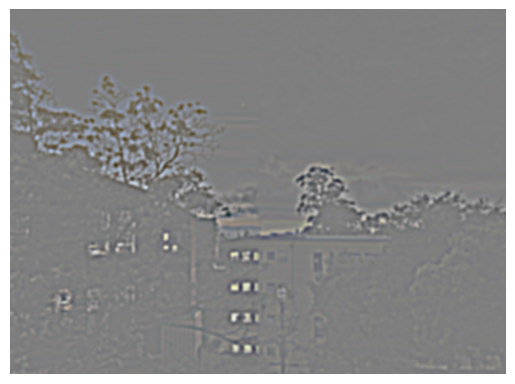

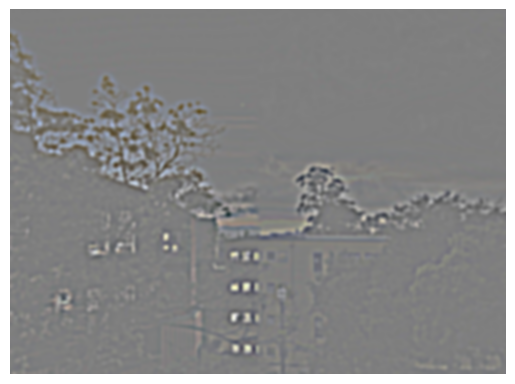

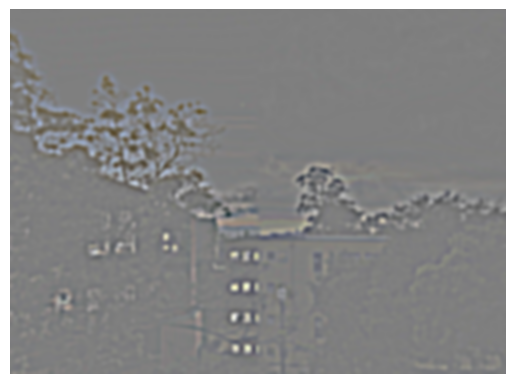

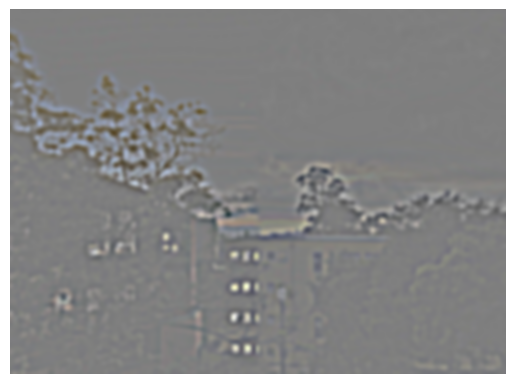

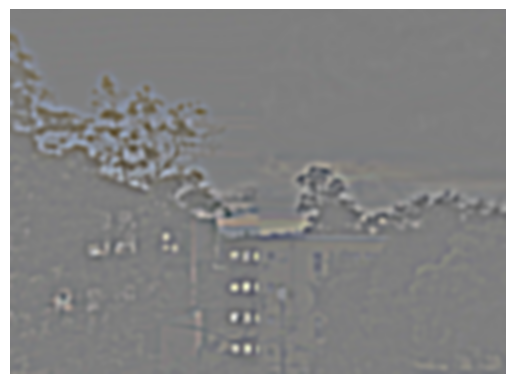

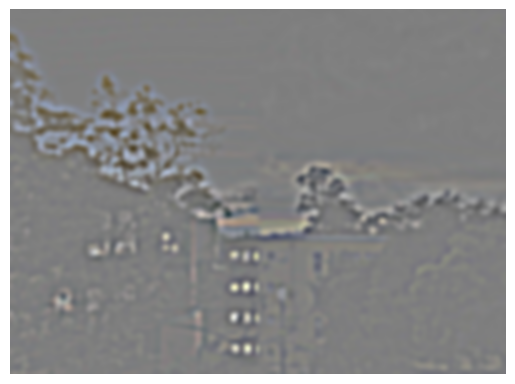

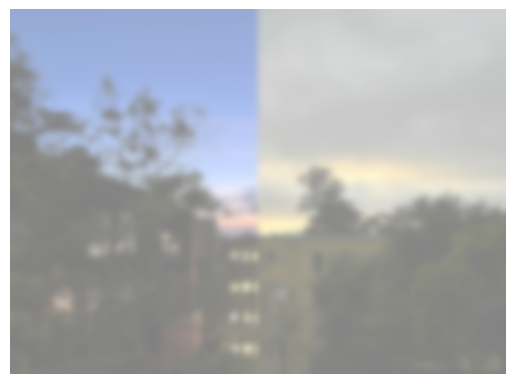

In [312]:
for i in range(9):
    plt.imshow(vis_derivative(C_levels[i]))
    plt.axis('off')
    plt.show()
    save_image(OUTS['p2_4']/f'foothill/mathed_level{i}.jpg', vis_derivative(C_levels[i]))

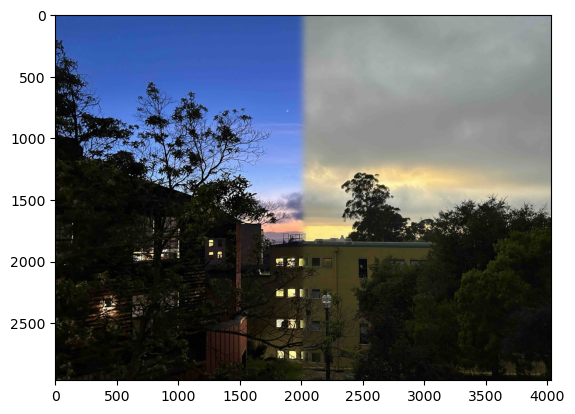

In [307]:
plt.imshow(out)

In [308]:
save_image(OUTS['p2_4']/f'foothill/combined.jpg', out)

In [311]:
C_levels = [A_levels[i] + B_levels[i] for i in range(len(A_levels))]

## Appendix
